In [5]:
import camb
import numpy as np
import os

def calculate_power_spectra(params, lensed=True):
    # Set up a new set of parameters for CAMB
    pars = camb.set_params(**params)
    # Calculate results for these parameters
    results = camb.get_results(pars)
    # Get dictionary of CAMB power spectra
    powers = results.get_cmb_power_spectra(pars, CMB_unit='muK')
    # Choose the appropriate power spectrum
    if lensed:
        cl = powers['total']
    else:
        cl = powers['unlensed_scalar']
    # Cut out the first 2 elements of the power spectra, which are zero
    cl_cut = cl[2:]
    # Get the TT, TE, and EE power spectra
    cl_tt = cl_cut[:, 0]
    cl_te = cl_cut[:, 3]
    cl_ee = cl_cut[:, 1]
    return cl_tt, cl_te, cl_ee

params = {
    # Parameters that are part of the proposal distribution:
    'ombh2': 0.025,                # Baryon density parameter
    'omch2': 0.122,                # Cold dark matter density parameter
    'cosmomc_theta': 1.04109/100,       # Theta_MC - need to be transformed
    'tau': 0.06,                   # Optical depth to reionization
    'ns': 0.965,                   # Scalar spectral index
    'As': 2.0e-9,# the scalar amplitude, need to be transformed for proposal distribution

    # Fixed parameters:
    #'H0': 69.5,                    # Hubble constant in km/s/Mpc (Fixed)
    'mnu': 0.06,                   # Sum of neutrino masses in eV (Fixed)
    'omk': 0,                      # Curvature density parameter, flat universe (Fixed)
    'halofit_version': 'mead',     # Non-linear matter power spectrum model version (Fixed)
    'lmax': 2800                   # Maximum multipole number for calculations (Fixed)
}



cl_tt, cl_te, cl_ee = calculate_power_spectra(params, lensed=True)
print(cl_tt)
print(cl_te)
print(cl_ee)

[982.32562024 927.57538209 875.41964977 ...  36.22063115  36.11447954
  36.00921749]
[ 2.75474425  3.09469103  2.90353789 ... -1.26516941 -1.27129668
 -1.27752765]
[0.03586869 0.04609061 0.04003475 ... 1.56565523 1.56519372 1.56468134]


In [187]:
import likelihood
from likelihood import PlanckLitePy

likelihood_function = likelihood.PlanckLitePy(spectra='TTTEEE')

likelihood_function.loglike(cl_tt, cl_te, cl_ee)

-1707.2607058668505

In [243]:
def process_params_and_calculate_spectra(array):
    array = array.copy()  # Create a copy of the array
    # Modify the third and sixth elements of the array
    array[2] /= 100
    array[5] = np.exp(array[5]) / 1e10

    # Set the parameters for the proposal distribution
    params = {
        'ombh2': array[0],
        'omch2': array[1],
        'cosmomc_theta': array[2],
        'tau': array[3],
        'ns': array[4],
        'As': array[5],

        
        'mnu': 0.06,
        'omk': 0,
        'halofit_version': 'mead',
        'lmax': 2800
    }

    # Call the calculate_power_spectra function and return the result
    return calculate_power_spectra(params)

In [220]:
def proposal_distribution(current_state):
    step_sizes = np.array([
        np.sqrt(0.0001**2),  # ombh2
        np.sqrt(0.001**2),   # omch2
        np.sqrt(0.0004**2),  # theta_MC_100
        np.sqrt(0.006**2),   # tau
        np.sqrt(0.004**2),   # ns
        np.sqrt(0.001**2)    # log(10^10 As)
    ])
    proposal_step = np.random.normal(0, step_sizes)
    return current_state + proposal_step



def proposal_distribution_2(current_state):
    step_sizes = np.array([
        np.sqrt(0.001**2),  # ombh2
        np.sqrt(0.001**2),   # omch2
        np.sqrt(0.0004**2),  # theta_MC_100
        np.sqrt(0.006**2),   # tau
        np.sqrt(0.004**2),   # ns
        np.sqrt(0.01**2)    # log(10^10 As)
    ])
    proposal_step = np.random.normal(0, step_sizes)
    return current_state + proposal_step

a = 2
def proposal_distribution_3(current_state):
    step_sizes = np.array([
        0.0001/a,  # ombh2
        0.0005/a,  # omch2
        0.0002/a,  # theta_MC_100
        0.003/a,   # tau
        0.002/a,   # ns
        0.001/a    # log(10^10 As)
    ])
    proposal_step = np.random.normal(0, step_sizes)
    return current_state + proposal_step

In [221]:
import numpy as np
import pickle 
import os
import time
from camb.model import CAMBParamRangeError

class MCMC_MH:
    def __init__(self, likelihood, proposal_distribution, priors, num_samples, num_chains, stepsize=0.5, burnin_ratio=0.05, resume=False):
        self.likelihood = likelihood
        self.proposal_distribution = proposal_distribution
        self.priors = priors
        self.num_samples = num_samples
        self.num_chains = num_chains
        self.stepsize = stepsize
        self.burnin = int(burnin_ratio * num_samples)  # calculate burn-in steps as 5% of total samples
        self.checkpoint_interval = 100
        self.resume = resume
        self.R_minus_one = None 

        self.curr_state = self.generate_initial_states()
        self.curr_likeli = [likelihood.loglike(*process_params_and_calculate_spectra(state)) for state in self.curr_state]
        self.samples = [[] for _ in range(num_chains)]
        self.likelihoods = [[] for _ in range(num_chains)]  # add this line

        if resume:
            self.load_checkpoint()
        elif os.path.exists('./checkpoints/checkpoint_burnin.pkl') or os.path.exists('./checkpoints/checkpoint_production.pkl'):
            raise ValueError("The checkpoint files 'checkpoint_burnin.pkl' and 'checkpoint_production.pkl' should not exist when starting a new run.")

    def generate_initial_states(self):
        initial_states = []
        for _ in range(self.num_chains):
            state = [prior.rvs() for prior in self.priors]
            initial_states.append(state)
        return initial_states

    def save_checkpoint(self, iteration, burn_in=False):
        if not os.path.exists('./checkpoints'):
            os.makedirs('./checkpoints')
        filename = f'./checkpoints/checkpoint_{"burnin" if burn_in else "production"}.pkl'
        with open(filename, 'wb') as f:
            pickle.dump((self.curr_state, self.samples, self.likelihoods, self.R_minus_one), f)  # modify this line

    def load_checkpoint(self):
        checkpoint_file_prod = './checkpoints/checkpoint_production.pkl'
        checkpoint_file_burnin = './checkpoints/checkpoint_burnin.pkl'
        
        if os.path.exists(checkpoint_file_prod):
            with open(checkpoint_file_prod, 'rb') as f:
                self.curr_state, self.samples, self.likelihoods, self.R_minus_one = pickle.load(f)
        elif os.path.exists(checkpoint_file_burnin):
            with open(checkpoint_file_burnin, 'rb') as f:
                self.curr_state, self.samples, self.likelihoods, self.R_minus_one = pickle.load(f)
        else:
            raise ValueError("No checkpoint files found to resume from.")

    def burn_in(self):
        start_time = time.time()
        if self.resume:
            self.load_checkpoint()

        for i in range(self.burnin):
            for j in range(self.num_chains):
                self.mcmc_updater(j)
            if (i + 1) % self.checkpoint_interval == 0:
                self.save_checkpoint(i + 1, burn_in=True)
                elapsed_time = time.time() - start_time
                print(f"Completed {i+1} burn-in steps in {elapsed_time} seconds")

    def mcmc_updater(self, chain_index):
        proposal_state = self.proposal_distribution(self.curr_state[chain_index])
        proposal_state = [max(0, value) for value in proposal_state]

        try:
            prop_loglikeli = self.likelihood.loglike(*process_params_and_calculate_spectra(proposal_state))
        except CAMBParamRangeError:
            prop_loglikeli = -np.inf
        except Exception as e:
            print(f"An error occurred: {e}")
            prop_loglikeli = -np.inf

        accept_crit = prop_loglikeli - self.curr_likeli[chain_index]
        accept_threshold = np.log(np.random.uniform(0, 1))

        if accept_crit > accept_threshold:
            self.curr_state[chain_index], self.curr_likeli[chain_index] = proposal_state, prop_loglikeli
            self.likelihoods[chain_index].append(prop_loglikeli)  # add this line
        else:
            pass

        return self.curr_state[chain_index], self.curr_likeli[chain_index]

    def metropolis_hastings(self):
        start_time = time.time()
        self.burn_in()  # perform burn-in before production run

        if self.resume:
            self.load_checkpoint()

        for i in range(self.num_samples):
            for j in range(self.num_chains):
                self.curr_state[j], self.curr_likeli[j] = self.mcmc_updater(j)
                self.samples[j].append(self.curr_state[j])
                #print(self.curr_state[j])
            if (i + 1) % self.checkpoint_interval == 0:
                self.save_checkpoint(i + 1)
                elapsed_time = time.time() - start_time
                #print(f"Completed {i+1} steps in {elapsed_time} seconds")
            if (i + 1) % 1 == 0:
                self.calculate_convergence()

        return self.samples

    def calculate_convergence(self):
        chain_means = [np.mean(np.array(chain), axis=0) for chain in self.samples]
        chain_vars = [np.var(np.array(chain), axis=0, ddof=1) for chain in self.samples]

        grand_mean = np.mean(chain_means, axis=0)

        B = np.sum((chain_means - grand_mean)**2, axis=0) * len(self.samples[0]) / (len(self.samples) - 1)
        W = np.mean(chain_vars, axis=0)

        var_plus = (len(self.samples[0]) - 1) / len(self.samples[0]) * W + B / len(self.samples[0])
        self.R_minus_one = (var_plus / W - 1).mean()  # Ensuring this averages over parameters if necessary

        print(f'R-1 statistic: {self.R_minus_one}')

In [218]:
from scipy.stats import norm
import numpy as np

va = 1

# Define priors for each parameter
priors = [
    norm(loc=0.0224, scale=np.sqrt(va)*0.0001),  # ombh2
    norm(loc=0.12, scale=np.sqrt(va)*0.001),  # omch2
    norm(loc=1.04109, scale=np.sqrt(va)*0.0004),  # theta_MC_100
    norm(loc=0.055, scale=np.sqrt(va)*0.006),  # tau
    norm(loc=0.965, scale=np.sqrt(va)*0.004),  # ns
    norm(loc=3.05, scale=np.sqrt(va)*0.001)  # log(10^10 As)
]

# # Define priors for each parameter
# priors = [
#     uniform(loc=0.005, scale=0.1-0.005),  # ombh2
#     uniform(loc=0.001, scale=0.99-0.001),  # omch2
#     uniform(loc=1.04, scale=0.1),  # theta_MC_100
#     uniform(loc=0.01, scale=0.8-0.01),  # tau
#     uniform(loc=0.8, scale=1.2-0.8),  # ns
#     uniform(loc=1.61, scale=3.91-1.61)  # log(10^10 As)
# ]

# Initialize the MCMC_MH object with the priors instead of the initial state
mcmc = MCMC_MH(likelihood_function, proposal_distribution_3, priors, 10000, stepsize=0.1, burnin_ratio=0.00, resume=False, num_chains=4)

In [222]:
mcmc.metropolis_hastings()

-298.5097533552803
Rejected
[0.02240132016359074, 0.12038713239092623, 1.040743626975465, 0.05889108653084551, 0.9637305877940495, 3.050987641532063]
-309.02237821263077
Rejected
[0.022194682120482628, 0.1200388441237459, 1.0409216053951085, 0.058087492250277116, 0.9597654430756575, 3.048378653171703]
-291.2205623183243
Rejected
[0.022351652387638164, 0.11946657440501154, 1.0410815614763491, 0.057661371273369524, 0.9683199385191412, 3.0472777586175575]
-302.11430990681123
Rejected
[0.022442814510993187, 0.11902004728783996, 1.0404029699063595, 0.06121192387290878, 0.9647891632005159, 3.053382146131707]
R-1 statistic: 9.846771431152726
-294.25391662531285
Rejected
[0.02240132016359074, 0.12038713239092623, 1.040743626975465, 0.05889108653084551, 0.9637305877940495, 3.050987641532063]
-344.8122389649229
Rejected
[0.022194682120482628, 0.1200388441237459, 1.0409216053951085, 0.058087492250277116, 0.9597654430756575, 3.048378653171703]
-312.01390255196713
Rejected
[0.022351652387638164, 0.

[[[0.022402799512881662,
   0.12076389031078863,
   1.0409971657644208,
   0.050005846417429084,
   0.968433276564013,
   3.051494007683505],
  [0.022381302853866927,
   0.12064104766622172,
   1.0407624570363685,
   0.054708295703746364,
   0.969491703926488,
   3.0513543878608598],
  [0.022423455419933343,
   0.12081011429921282,
   1.0406853762862582,
   0.05818275256046519,
   0.9673420630944272,
   3.0506762013869406],
  [0.02238407887728995,
   0.12023684862119052,
   1.0407978421765318,
   0.05911951119572318,
   0.9663461397030324,
   3.0502302816293794],
  [0.02238407887728995,
   0.12023684862119052,
   1.0407978421765318,
   0.05911951119572318,
   0.9663461397030324,
   3.0502302816293794],
  [0.022330030015559887,
   0.12025190817930095,
   1.0406665431016586,
   0.058698444481093244,
   0.965460802111851,
   3.0506965922425153],
  [0.022330030015559887,
   0.12025190817930095,
   1.0406665431016586,
   0.058698444481093244,
   0.965460802111851,
   3.0506965922425153],
  

In [221]:
import pickle
import matplotlib.pyplot as plt

def load_data_from_pickle(filename):
    with open(filename, 'rb') as f:
        data = pickle.load(f)
    return data

# Load data from the production pickle file
#data = load_data_from_pickle('./checkpoints/checkpoint_production.pkl')
#data = load_data_from_pickle('./archive/4chains_10000/checkpoint_production.pkl')
data = load_data_from_pickle('./archive/4chains_notworking/checkpoint_production.pkl')
data2 = load_data_from_pickle('./archive/02_extended_2chain/checkpoint_production.pkl')

# Extract parameters and R-1 values
#parameters, states, likelihood, R_minus_one, test= data
parameters, states, likelihood, R_minus_one= data
states[0] = states[0][:-1]
states[1] = states[1][:-1]
states[2] = states[2][:-1]


data_reshaped = np.array(states).reshape(-1, 6)  # This flattens the chains together

data2_reshaped = np.array(data2[1]).reshape(-1, 6)  # This flattens the chains together

np.savetxt('mcmc_output.txt', data_reshaped, header='param1 param2 param3 param4 param5 param6', comments='')



In [200]:
print(np.array(states[0]).shape)

(12523, 6)


In [222]:
from getdist import MCSamples, plots

names = ["x%s"%i for i in range(6)]
labels =  ["x_%s"%i for i in range(6)]

#samples = MCSamples(samples=np.array(states[0]),names = names, labels = labels)
samples = MCSamples(samples=data_reshaped,names = names, labels = labels)

samples2 = MCSamples(samples=data2_reshaped,names = names, labels = labels)



Removed no burn in
Removed no burn in


Removed no burn in
Removed no burn in


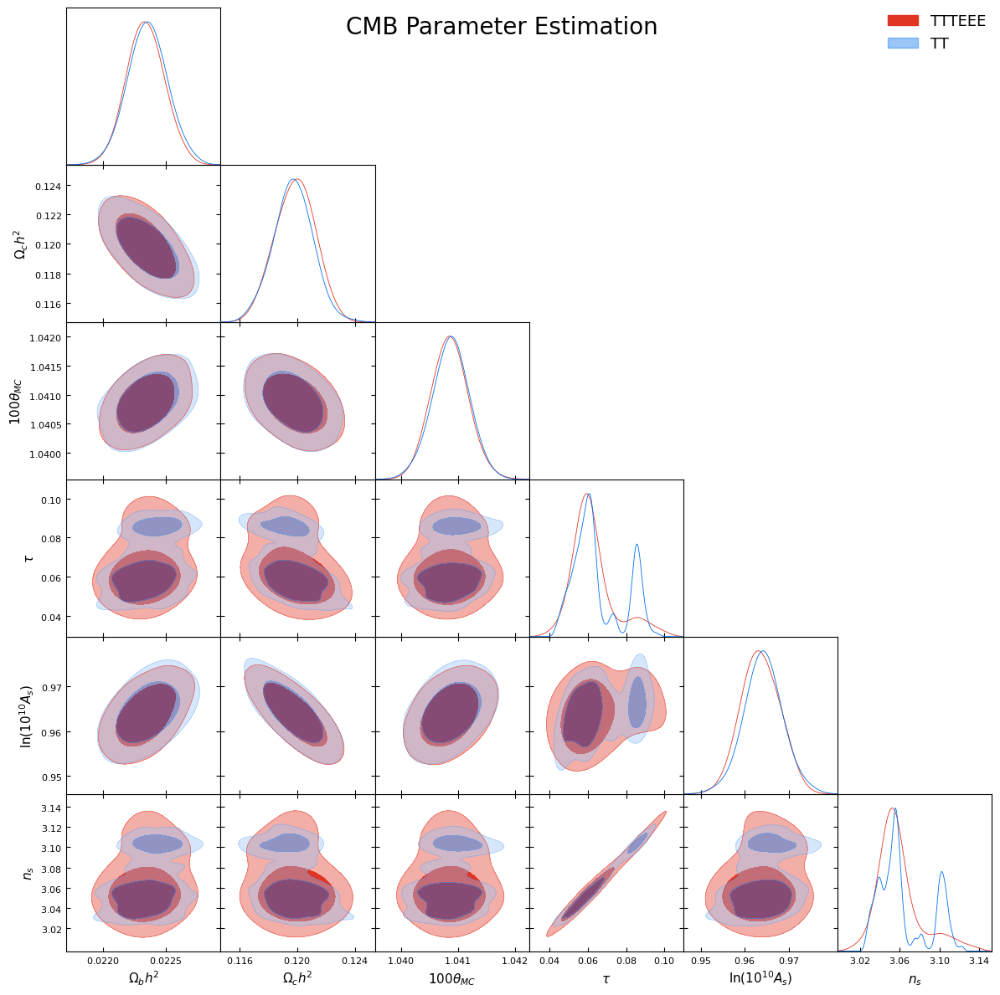

In [227]:
from getdist import MCSamples, plots
import matplotlib.pyplot as plt

# Define the names and labels using LaTeX syntax for the parameters
names = ["\Omega_b h^2", "\Omega_c h^2", "100\theta_{MC}", "\tau", "\ln(10^{10} A_s)", "n_s"]
labels =  [r"\Omega_b h^2", r"\Omega_c h^2", r"100\theta_{MC}", r"\tau", r"\ln(10^{10} A_s)", r"n_s"]

samples = MCSamples(samples=data_reshaped, names=names, labels=labels, label='TTTEEE')
samples2 = MCSamples(samples=data2_reshaped, names=names, labels=labels, label='TT')

# Define the true values from the table
true_values = [0.02229, 0.1197, 1.04087, 0.0536, 3.041, 0.9656]

g = plots.get_subplot_plotter()
g.settings.figure_legend_frame = False
g.settings.alpha_filled_add = 0.4
g.settings.title_limit_fontsize = 14
g.settings.legend_fontsize = 16  # Increase legend font size

g.triangle_plot([samples, samples2], filled=True, legend_labels=['TTTEEE', 'TT'], legend_loc='upper right')

# Add red lines for the true values
# for i, val in enumerate(true_values):
#     g.subplots[i, i].axvline(val, color='red')  # vertical line on the histograms
#     for j in range(i+1, len(true_values)):
#         g.subplots[j, i].axhline(val, color='red')  # horizontal line on the 2D density plots

plt.suptitle('CMB Parameter Estimation', fontsize=20)
plt.show()

Removed no burn in
Removed no burn in


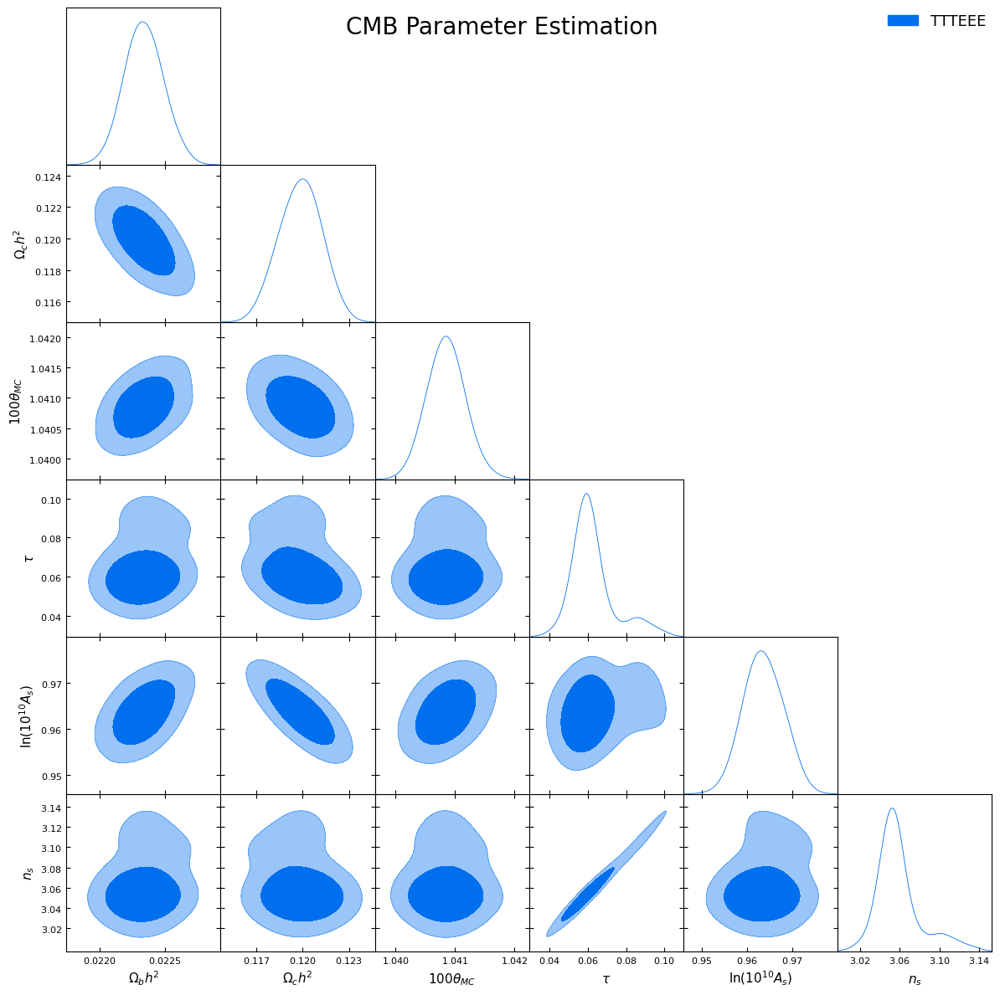

In [228]:
from getdist import MCSamples, plots
import matplotlib.pyplot as plt

# Define the names and labels using LaTeX syntax for the parameters
names = ["\Omega_b h^2", "\Omega_c h^2", "100\theta_{MC}", "\tau", "\ln(10^{10} A_s)", "n_s"]
labels =  [r"\Omega_b h^2", r"\Omega_c h^2", r"100\theta_{MC}", r"\tau", r"\ln(10^{10} A_s)", r"n_s"]

samples = MCSamples(samples=data_reshaped, names=names, labels=labels, label='TTTEEE')
samples2 = MCSamples(samples=data2_reshaped, names=names, labels=labels, label='TT')

# Define the true values from the table
true_values = [0.02229, 0.1197, 1.04087, 0.0536, 3.041, 0.9656]

g = plots.get_subplot_plotter()
g.settings.figure_legend_frame = False
g.settings.alpha_filled_add = 0.4
g.settings.title_limit_fontsize = 14
g.settings.legend_fontsize = 16  # Increase legend font size

g.triangle_plot([samples], filled=True, legend_labels=['TTTEEE', 'TT'], legend_loc='upper right')

# Add red lines for the true values
# for i, val in enumerate(true_values):
#     g.subplots[i, i].axvline(val, color='red')  # vertical line on the histograms
#     for j in range(i+1, len(true_values)):
#         g.subplots[j, i].axhline(val, color='red')  # horizontal line on the 2D density plots

plt.suptitle('CMB Parameter Estimation', fontsize=20)
plt.show()

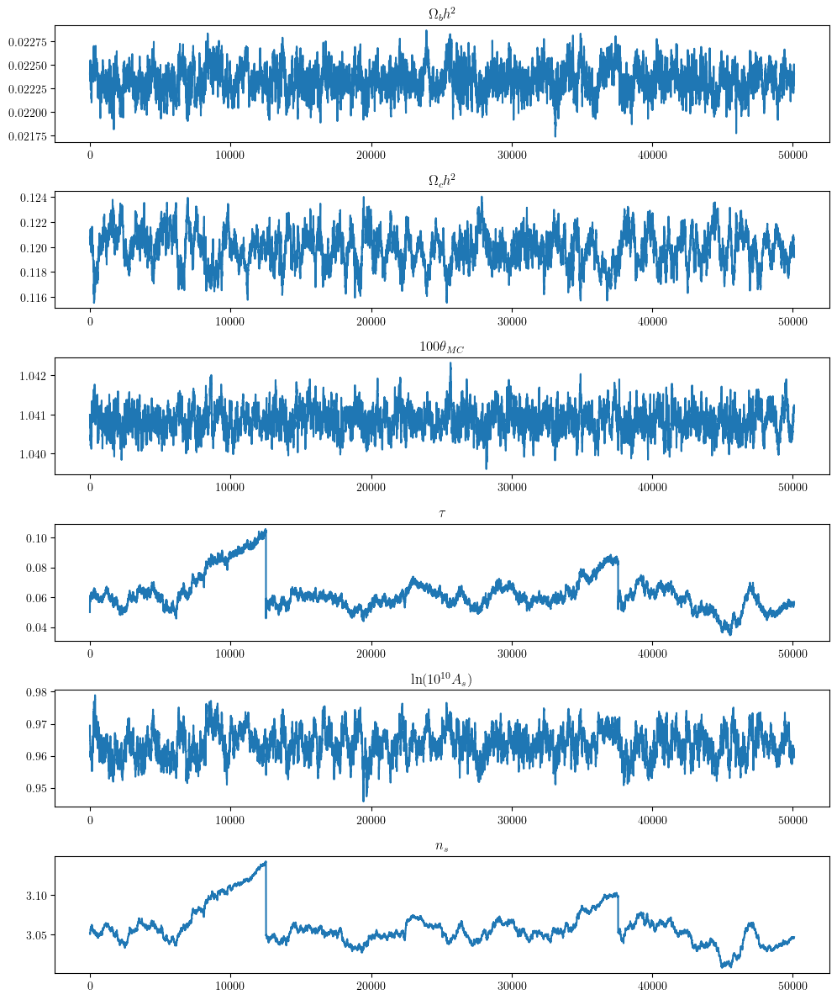

In [232]:
import matplotlib.pyplot as plt

# Enable LaTeX in matplotlib
plt.rcParams['text.usetex'] = True

# Define the number of parameters
num_params = data_reshaped.shape[1]

# Create a new figure
plt.figure(figsize=(10, 2*num_params))

# Loop over all parameters
for i in range(num_params):
    # Create a subplot for each parameter
    plt.subplot(num_params, 1, i+1)
    
    # Plot the trace of the parameter
    plt.plot(data_reshaped[:, i])
    
    # Set the title of the subplot to the parameter's name
    plt.title(r'${}$'.format(labels[i]))  # Wrap the title in LaTeX math mode

# Automatically adjust the subplot layout
plt.tight_layout()

# Display the figure
plt.show()

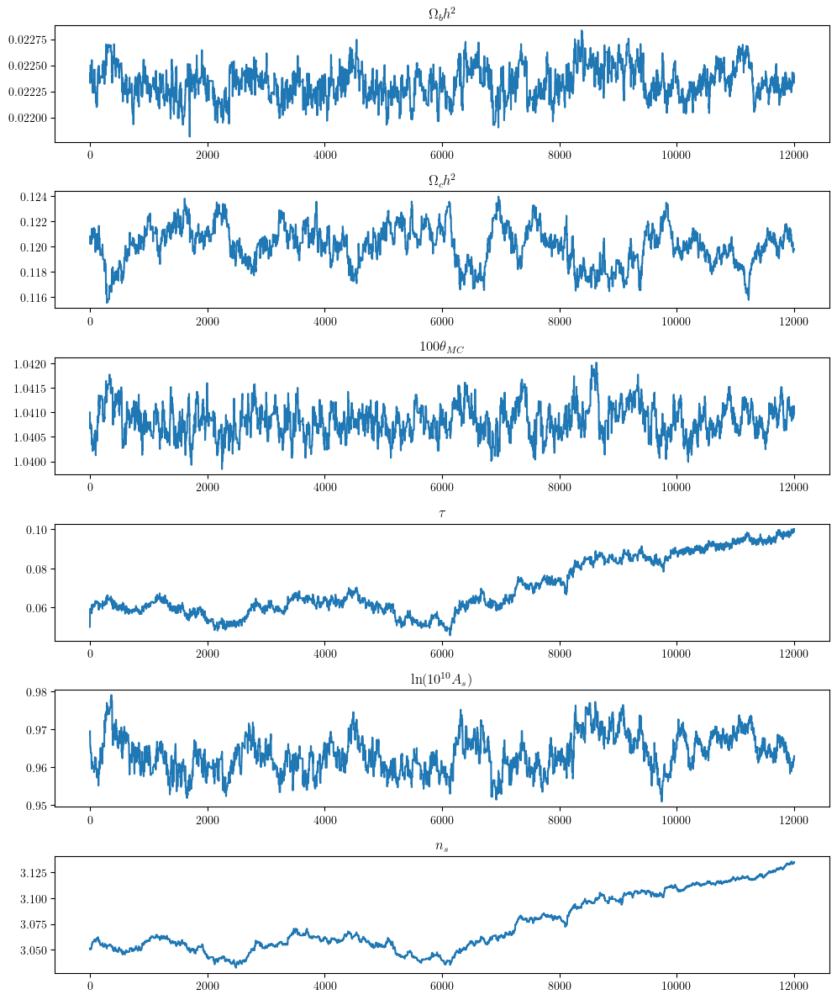

          Parameter   Average                             1 Std Confidence  \
0      \Omega_b h^2  0.022330  (0.02217430398773885, 0.022484701962377875)   
1      \Omega_c h^2  0.120058    (0.11851586457404402, 0.1216004024349061)   
2    100\theta_{MC}  1.040833       (1.040505089514296, 1.041160938962936)   
3              \tau  0.069812   (0.05541859560247067, 0.08420618316550982)   
4  \ln(10^{10} A_s)  0.963412     (0.9584593114348348, 0.9683655907611728)   
5               n_s  3.073657      (3.046151004189229, 3.1011626109130748)   

                              2 Std Confidence  
0  (0.022019105000419332, 0.02263990094969739)  
1   (0.11697359564361297, 0.12314267136533714)  
2       (1.040177164789976, 1.041488863687256)  
3    (0.0410248018209511, 0.09859997694702939)  
4     (0.9535061717716657, 0.9733187304243418)  
5      (3.018645200827306, 3.1286684142749976)  


In [242]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Enable LaTeX in matplotlib
plt.rcParams['text.usetex'] = True

# Define the number of parameters
num_params = data_reshaped.shape[1]

# Create a new figure
plt.figure(figsize=(10, 2*num_params))

# Initialize a DataFrame to store the statistics
stats = pd.DataFrame(columns=['Parameter', 'Average', '1 Std Confidence', '2 Std Confidence'])

# Loop over all parameters
for i in range(num_params):
    # Create a subplot for each parameter
    plt.subplot(num_params, 1, i+1)
    
    # Plot the trace of the parameter for the first 12000 data points
    plt.plot(data_reshaped[:12000, i])
    
    # Set the title of the subplot to the parameter's name
    plt.title(r'${}$'.format(labels[i]))  # Wrap the title in LaTeX math mode

    # Calculate the average and confidence intervals
    avg = np.mean(data_reshaped[:12000, i])
    std = np.std(data_reshaped[:12000, i])
    stats.loc[i] = {
        'Parameter': labels[i],
        'Average': avg,
        '1 Std Confidence': (avg - std, avg + std),
        '2 Std Confidence': (avg - 2*std, avg + 2*std)
    }

# Automatically adjust the subplot layout
plt.tight_layout()

# Display the figure
plt.show()

# Display the statistics
print(stats)

/var/folders/0h/2pkv9xxd45lfrx3mx45bxhxw0000gn/T/ipykernel_51876/161684853.py:26: RuntimeWarning: invalid value encountered in divide
  R = np.sqrt(var_estimate / W)


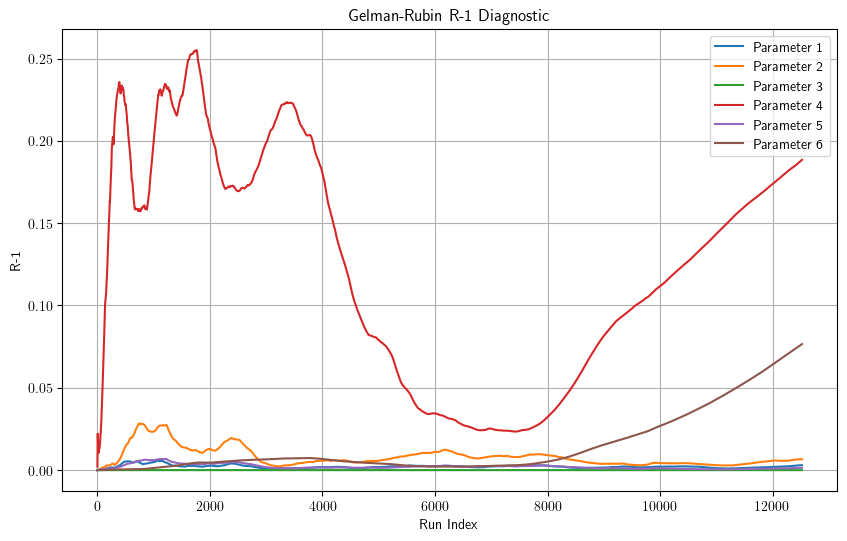

In [240]:
import numpy as np
import matplotlib.pyplot as plt

# Convert states to a numpy array
states = np.array(states)

# Initialize arrays to store the running means and variances
running_means = np.zeros_like(states)
running_vars = np.zeros_like(states)

# Calculate the running means and variances for each chain
for i in range(1, states.shape[1]):
    running_means[:, i, :] = running_means[:, i-1, :] + (states[:, i, :] - running_means[:, i-1, :]) / (i+1)
    running_vars[:, i, :] = ((i-1) * running_vars[:, i-1, :] + (states[:, i, :] - running_means[:, i, :]) * (states[:, i, :] - running_means[:, i-1, :])) / i

# Calculate the between-chain variance
B = states.shape[1] / (states.shape[0] - 1) * np.sum((running_means - np.mean(running_means, axis=0))**2, axis=0)

# Calculate the within-chain variance
W = np.mean(running_vars, axis=0)

# Calculate the variance estimate for the pooled chains
var_estimate = (1 - 1/states.shape[1]) * W + 1/states.shape[1] * B

# Calculate the potential scale reduction factor
R = np.sqrt(var_estimate / W)

# Plot the R-1 diagnostic
plt.figure(figsize=(10, 6))
for i in range(states.shape[2]):
    plt.plot(R[:, i] - 1, label=f'Parameter {i+1}')
plt.title(r'Gelman-Rubin R-1 Diagnostic')
plt.xlabel('Run Index')
plt.ylabel('R-1')
plt.legend()
plt.grid(True)
plt.show()

In [244]:
def process_params_and_calculate_spectra_optimized(array):
    params = {
        'ombh2': array[0],
        'omch2': array[1],
        'cosmomc_theta': array[2] / 100,
        'tau': array[3],
        'ns': array[4],
        'As': np.exp(array[5]) / 1e10,
        'mnu': 0.06,
        'omk': 0,
        'halofit_version': 'mead',
        'lmax': 2800
    }
    return calculate_power_spectra(params)

In [245]:
def calculate_power_spectra(params, lensed=True, accuracy_boost=0.5, l_sample_boost=0.5, l_accuracy_boost=0.5):
    # Update the params dictionary with lower accuracy settings
    params.update({
        'AccuracyBoost': accuracy_boost,
        'lSampleBoost': l_sample_boost,
        'lAccuracyBoost': l_accuracy_boost,
        # You can adjust these values or add other parameters to decrease accuracy further
        'DoLateRadTruncation': True
    })
    
    # Set parameters including the updated accuracy settings
    pars = camb.set_params(**params)
    
    # Get results from CAMB
    results = camb.get_results(pars)
    
    # Get CMB power spectra with specified units
    powers = results.get_cmb_power_spectra(pars, CMB_unit='muK')
    
    if lensed:
        cl = powers['total']
    else:
        cl = powers['unlensed_scalar']
    
    # Removing the monopole and dipole terms at l=0 and l=1
    cl_cut = cl[2:]
    cl_tt = cl_cut[:, 0]  # TT spectra
    cl_te = cl_cut[:, 3]  # TE spectra
    cl_ee = cl_cut[:, 1]  # EE spectra
    
    return cl_tt, cl_te, cl_ee

def process_params_and_calculate_spectra(array):
    array = array.copy()
    array[2] /= 100
    array[5] = np.exp(array[5]) / 1e10
    params = {
        'ombh2': array[0],
        'omch2': array[1],
        'cosmomc_theta': array[2],
        'tau': array[3],
        'ns': array[4],
        'As': array[5],
        'mnu': 0.06,
        'omk': 0,
        'halofit_version': 'mead',
        'lmax': 2800
    }
    return calculate_power_spectra(params)

In [249]:
print(stats['Average'].values)

[0.0223295  0.12005813 1.04083301 0.06981239 0.96341245 3.07365681]


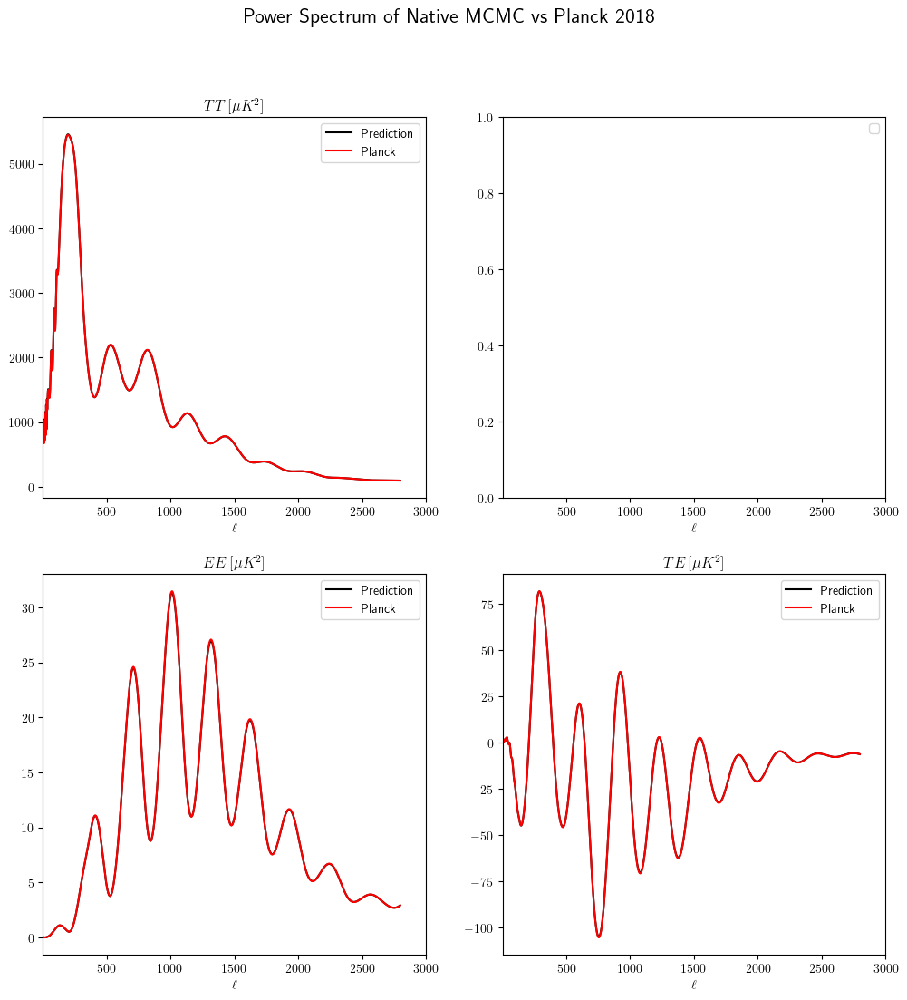

In [252]:
# Calculate the power spectra using the mean values
mean_cl_tt, mean_cl_te, mean_cl_ee = process_params_and_calculate_spectra(stats['Average'].values)

# Define the optimal parameters
optimal_params = np.array([0.02229, 0.1197, 1.04087, 0.0536, 0.9656,3.041])

# Calculate the power spectra using the optimal parameters
optimal_cl_tt, optimal_cl_te, optimal_cl_ee = process_params_and_calculate_spectra(optimal_params)

# Plot the power spectra calculated from the mean values
ls = np.arange(mean_cl_tt.shape[0])
fig, ax = plt.subplots(2,2, figsize = (12,12))
fig.suptitle('Power Spectrum of Native MCMC vs Planck 2018', fontsize=16)
ax[0,0].plot(ls, mean_cl_tt, color='k', label='Prediction')
ax[0,0].plot(ls, optimal_cl_tt, color='r', label='Planck')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')
ax[1,0].plot(ls, mean_cl_ee, color='k', label='Prediction')
ax[1,0].plot(ls, optimal_cl_ee, color='r', label='Planck')
ax[1,0].set_title(r'$EE\, [\mu K^2]$')
ax[1,1].plot(ls, mean_cl_te, color='k', label='Prediction')
ax[1,1].plot(ls, optimal_cl_te, color='r', label='Planck')
ax[1,1].set_title(r'$TE\, [\mu K^2]$')

for ax in ax.reshape(-1): 
    ax.set_xlim([2,3000])
    ax.set_xlabel(r'$\ell$')
    ax.legend()

plt.show()